In [1]:
import os
import torchio as tio

# pra usar cpu, descomentar linha abaixo
#os.environ["CUDA_VISIBLE_DEVICES"] = "-1"

import numpy as np
import math
import nibabel as nib

from sklearn.metrics import classification_report, confusion_matrix, ConfusionMatrixDisplay
from sklearn.preprocessing import LabelEncoder
from sklearn.utils import shuffle

import tensorflow as tf
from tensorflow.keras.utils import to_categorical
from imblearn.over_sampling import SMOTE

import matplotlib.pyplot as plt
from matplotlib.backends.backend_pdf import PdfPages
import numpy as np
import gc
import seaborn as sns

from reportlab.lib.pagesizes import letter
from reportlab.pdfgen import canvas
from PIL import Image
import tempfile
from math import ceil
import random

#import wandb

2025-12-04 22:45:46.282609: E external/local_xla/xla/stream_executor/cuda/cuda_fft.cc:485] Unable to register cuFFT factory: Attempting to register factory for plugin cuFFT when one has already been registered
2025-12-04 22:45:47.375324: E external/local_xla/xla/stream_executor/cuda/cuda_dnn.cc:8454] Unable to register cuDNN factory: Attempting to register factory for plugin cuDNN when one has already been registered
2025-12-04 22:45:47.658769: E external/local_xla/xla/stream_executor/cuda/cuda_blas.cc:1452] Unable to register cuBLAS factory: Attempting to register factory for plugin cuBLAS when one has already been registered
2025-12-04 22:45:49.830400: I tensorflow/core/platform/cpu_feature_guard.cc:210] This TensorFlow binary is optimized to use available CPU instructions in performance-critical operations.
To enable the following instructions: AVX2 FMA, in other operations, rebuild TensorFlow with the appropriate compiler flags.


In [2]:
from tensorflow.keras import mixed_precision

gpus = tf.config.experimental.list_physical_devices('GPU')
if gpus:
    try:
        for gpu in gpus:
            tf.config.experimental.set_memory_growth(gpu, True)  # Evita uso excessivo de memória
        print("GPU habilitada com sucesso!")
        print("Memory Growth habilitado para a GPU")
    except RuntimeError as e:
        print(e)

mixed_precision.set_global_policy("mixed_float16")

tf.get_logger().setLevel('ERROR')

GPU habilitada com sucesso!
Memory Growth habilitado para a GPU


I0000 00:00:1764899185.553381  684660 cuda_executor.cc:1001] could not open file to read NUMA node: /sys/bus/pci/devices/0000:21:00.0/numa_node
Your kernel may have been built without NUMA support.
I0000 00:00:1764899185.559666  684660 cuda_executor.cc:1001] could not open file to read NUMA node: /sys/bus/pci/devices/0000:21:00.0/numa_node
Your kernel may have been built without NUMA support.
I0000 00:00:1764899185.559711  684660 cuda_executor.cc:1001] could not open file to read NUMA node: /sys/bus/pci/devices/0000:21:00.0/numa_node
Your kernel may have been built without NUMA support.


In [3]:
# FUNÇÕES
def load_nifti_data_balanced_preallocated(base_dir, class_names, augment=False, target_per_class=1000):
    
    available_transforms = [
        tio.RandomBlur(p=1.0),
        tio.RandomNoise(p=1.0, std=(0, 0.05)),
        tio.RandomAnisotropy(p=1.0),
        tio.RandomElasticDeformation(p=1.0),
        tio.RandomBiasField(p=1.0),
        tio.RandomMotion(p=1.0),
        tio.RandomSpike(p=1.0),
        tio.RandomGhosting(p=1.0),
    ]

    all_paths = []
    all_labels = []
    print("Passo 1: Coletando lista de arquivos...")
    for label in class_names:
        label_dir = os.path.join(base_dir, label)
        count = 0
        names = os.listdir(label_dir)
        for fname in names:
            if count < target_per_class:
                all_paths.append(os.path.join(label_dir, fname))
                all_labels.append(label)
                count += 1
    print(f"Total de {len(all_paths)} imagens encontradas.")

    label_encoder = LabelEncoder()
    label_encoder.classes_ = np.array(class_names)
    labels_encoded = label_encoder.transform(all_labels)
    labels_one_hot = to_categorical(labels_encoded, num_classes=len(class_names)).astype(np.float16) 
    
    all_paths_shuffled, labels_one_hot_shuffled = shuffle(all_paths, labels_one_hot, random_state=42)
    
    del all_labels, labels_encoded, labels_one_hot
    gc.collect()

    if not all_paths_shuffled:
        print("Nenhuma imagem encontrada.")
        return np.array([]), np.array([]), [], label_encoder.classes_

    print("Passo 2: Determinando o shape da imagem...")
    try:
        first_img_nib = nib.load(all_paths_shuffled[0])
        img_shape = first_img_nib.get_fdata(dtype=np.float16).shape
    except Exception as e:
        print(f"Erro ao carregar a primeira imagem: {e}")
        return

    total_images = len(all_paths_shuffled)
    print(f"Shape detectado: {img_shape}. Alocando memória para {total_images} imagens...")
    
    images_final = np.empty((total_images, *img_shape, 1), dtype=np.float16)
    paths_final = [None] * total_images

    print("Passo 3: Carregando e transformando imagens...")
    for i in range(total_images):
        img_path = all_paths_shuffled[i]
        try:
            img_nib = nib.load(img_path)
            img_data_f16 = img_nib.get_fdata(dtype=np.float16)
            
            if augment:
                # Seleciona aleatoriamente de 1 a 6 transformações do pool
                num_transforms = random.randint(1, 6)
                selected_transforms = random.sample(available_transforms, num_transforms)
                transform_composer = tio.Compose(selected_transforms)

                img_data_f32 = img_data_f16.astype(np.float32)
                subject = tio.Subject(
                    mri=tio.ScalarImage(tensor=img_data_f32[np.newaxis, ...], affine=img_nib.affine)
                )
                # Aplica a composição
                transformed_data_f32 = transform_composer(subject).mri.data.numpy().squeeze(axis=0)
                img_final = transformed_data_f32.astype(np.float16)
                
                del img_data_f32, subject, transformed_data_f32, transform_composer, selected_transforms
            else:
                img_final = img_data_f16
            
            images_final[i] = img_final.reshape((*img_shape, 1))
            paths_final[i] = img_path

        except Exception as e:
            print(f"Erro em {img_path}: {e}. Inserindo array vazio.")
            images_final[i] = np.zeros((*img_shape, 1), dtype=np.float16)
            paths_final[i] = img_path
        
        if (i + 1) % 50 == 0:
            gc.collect()
            print(f"Processado {i + 1}/{total_images}...")
            
    print("Passo 4: Carregamento concluído.")

    return images_final, labels_one_hot_shuffled, paths_final, label_encoder.classes_

def unificar_tamanhos_com_padding(lista_de_imagens):
    max_altura = 0
    max_largura = 0
    for img in lista_de_imagens:
        altura, largura = img.shape
        if altura > max_altura:
            max_altura = altura
        if largura > max_largura:
            max_largura = largura

    imagens_uniformes = []
    for img in lista_de_imagens:
        fundo = np.zeros((max_altura, max_largura))
        
        altura_img, largura_img = img.shape
        y_offset = (max_altura - altura_img) // 2
        x_offset = (max_largura - largura_img) // 2
        
        fundo[y_offset:y_offset+altura_img, x_offset:x_offset+largura_img] = img
        imagens_uniformes.append(fundo)
        
    return imagens_uniformes

def plot_views_uniforme_final(image, main_title, k=0, sag_idx=90, cor_idx=110, ax_idx=110, figsize=(15, 5), axes_pad=0.3):
    fig = plt.figure(figsize=figsize)
    grid = ImageGrid(fig, 111,
                    nrows_ncols=(1, 3),
                    axes_pad=axes_pad)
    
    slices_originais = [
        np.rot90(image[sag_idx, :, :], k=k),
        np.rot90(image[:, cor_idx, :], k=k),
        np.rot90(image[:, :, ax_idx], k=k)
    ]
    
    slices_uniformizadas = unificar_tamanhos_com_padding(slices_originais)
    
    titles = ["Sagital", "Coronal", "Axial"]

    for ax, im_slice, title in zip(grid, slices_uniformizadas, titles):
        ax.imshow(im_slice, cmap='gray')
        ax.set_title(title)
        ax.axis('off')

    fig.suptitle(main_title)
    plt.show()

In [4]:
# Definindo caminhos
dir_base = "/mnt/c/Users/Paulo Pires/Desktop/Alzheimer_cnn"

train_dir = f'{dir_base}/ADNI/ADNI_NORMALIZED/train'
val_dir = f'{dir_base}/ADNI/ADNI_NORMALIZED/validation'
test_dir = f'{dir_base}/ADNI/ADNI_NORMALIZED/test'

results_dir_base = f'{dir_base}/ADNI/ADNI_NORMALIZED/results/ruidos_pre_treino'
os.makedirs(results_dir_base, exist_ok=True)

transformations = ['noise']

In [5]:
n = len(os.listdir(results_dir_base))

if (n > 0):
    if (len(os.listdir(os.path.join(results_dir_base, f'test_{n}'))) < 3): 
        for item in os.listdir(os.path.join(results_dir_base, f"test_{n}")):
            os.remove(os.path.join(results_dir_base,  f"test_{n}", item))
        os.removedirs(os.path.join(results_dir_base, f'test_{n}'))
        n -= 1

folder_name = f"test_{str(n+1)}"
results_dir = os.path.join(results_dir_base, folder_name)
os.makedirs(results_dir, exist_ok=True)
print(f"pasta {folder_name} criada")

pasta test_5 criada


# Separação de conjuntos

In [6]:
# Nome das classes
# adni_class_names = ['cn', 'emci', 'mci', 'lmci', 'ad']
adni_class_names = ['cn', 'mci', 'ad']
# oasis_class_names = ['0.0', '0.5', '1.0', '2.0']
oasis_class_names = ['0.0', '0.5', '1.0']

n_adni_classes = len(adni_class_names)
n_oasis_classes = len(oasis_class_names)

train_images, train_labels, train_paths, class_labels = load_nifti_data_balanced_preallocated(
    train_dir, 
    adni_class_names, 
    augment=False
)

print(f"N treino: {len(train_paths)}")

val_images, val_labels, val_paths, _ = load_nifti_data_balanced_preallocated(
    val_dir, 
    adni_class_names, 
    augment=False
)

print(f"N validation: {len(val_paths)}")

Passo 1: Coletando lista de arquivos...
Total de 1599 imagens encontradas.
Passo 2: Determinando o shape da imagem...
Shape detectado: (156, 195, 160). Alocando memória para 1599 imagens...
Passo 3: Carregando e transformando imagens...
Processado 50/1599...
Processado 100/1599...
Processado 150/1599...
Processado 200/1599...
Processado 250/1599...
Processado 300/1599...
Processado 350/1599...
Processado 400/1599...
Processado 450/1599...
Processado 500/1599...
Processado 550/1599...
Processado 600/1599...
Processado 650/1599...
Processado 700/1599...
Processado 750/1599...
Processado 800/1599...
Processado 850/1599...
Processado 900/1599...
Processado 950/1599...
Processado 1000/1599...
Processado 1050/1599...
Processado 1100/1599...
Processado 1150/1599...
Processado 1200/1599...
Processado 1250/1599...
Processado 1300/1599...
Processado 1350/1599...
Processado 1400/1599...
Processado 1450/1599...
Processado 1500/1599...
Processado 1550/1599...
Passo 4: Carregamento concluído.
N trei


--- INICIANDO TESTE SMOTE (Amostra de 30 imagens) ---
Shape original dos dados: (30, 156, 195, 160, 1)
Aplicando SMOTE...
Gerados 6 novos exemplos sintéticos.
Apenas 6 amostras sintéticas geradas. Plotando todas.
Iniciando plotagem de 6 pares (Original vs Sintético)...


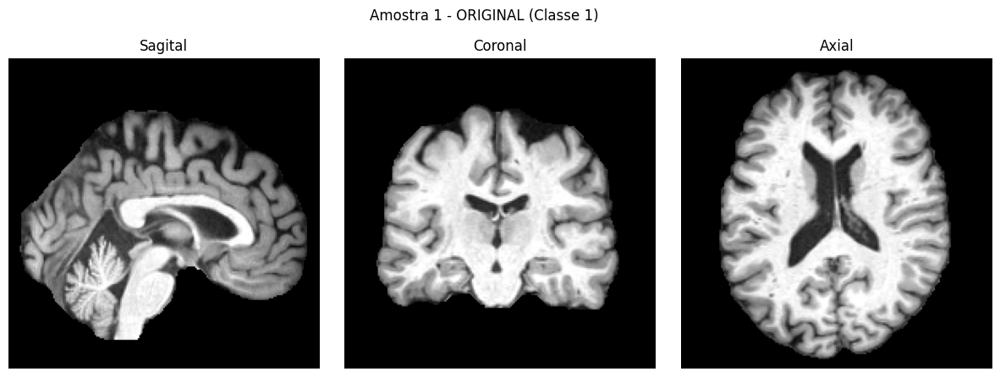

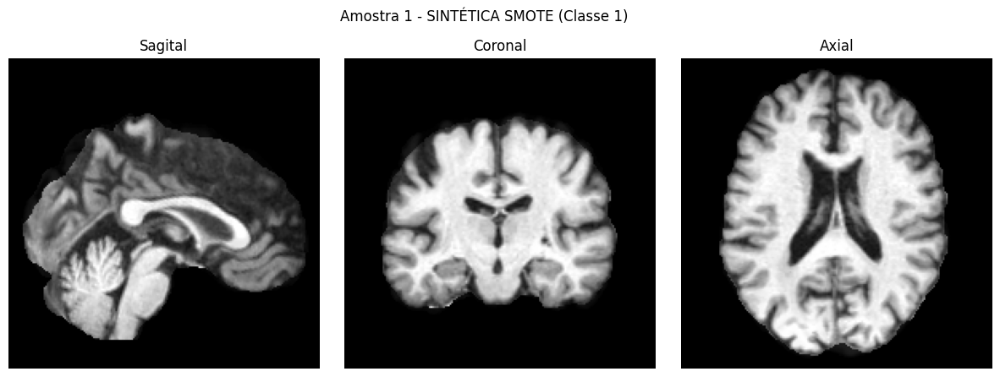

--------------------------------------------------


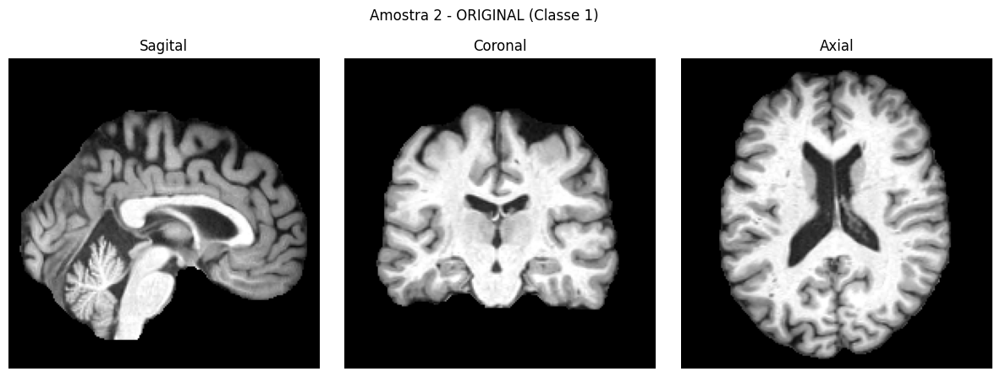

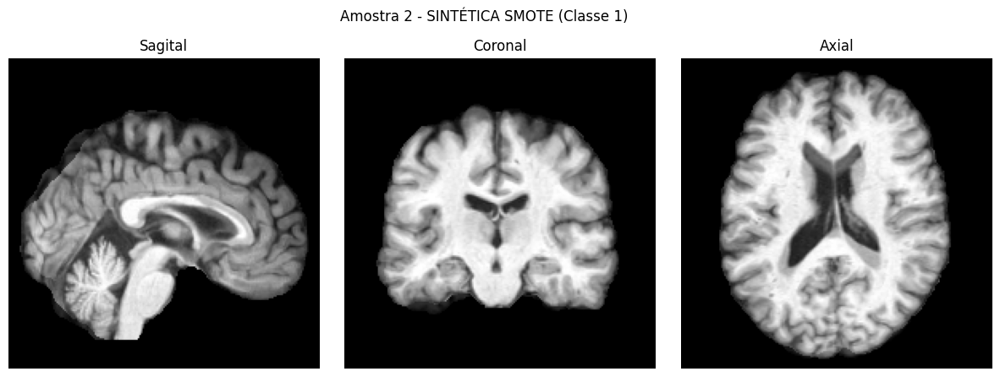

--------------------------------------------------


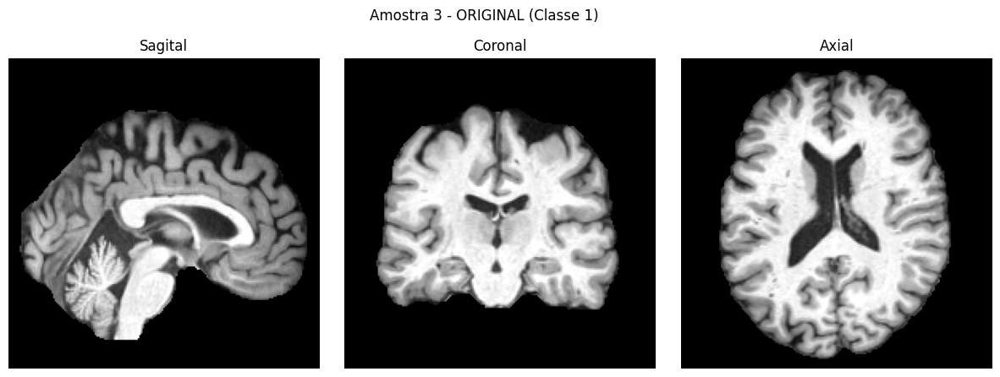

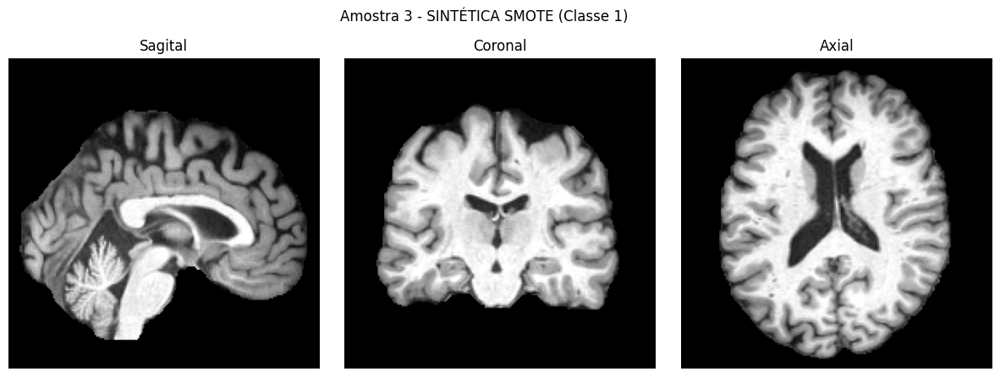

--------------------------------------------------


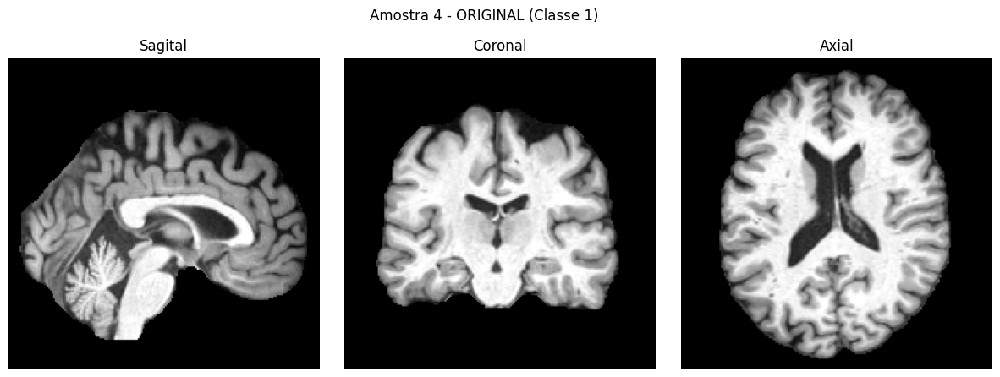

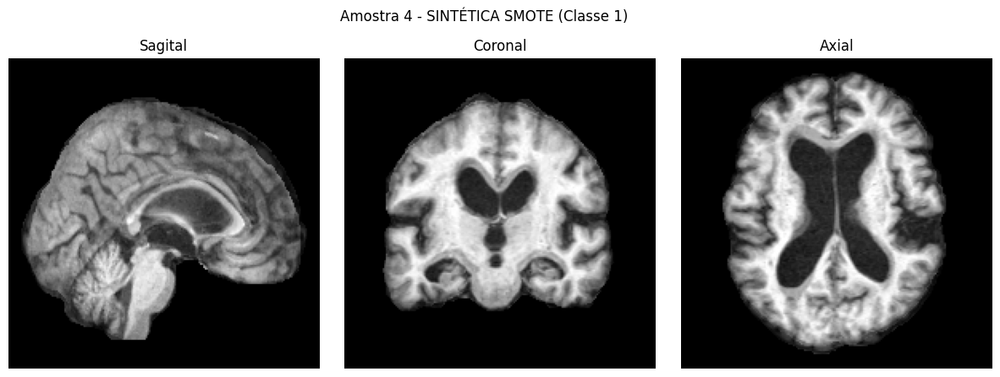

--------------------------------------------------


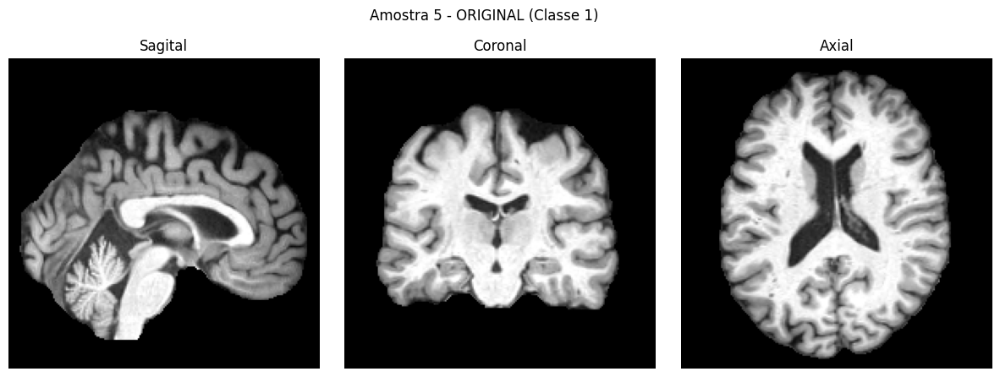

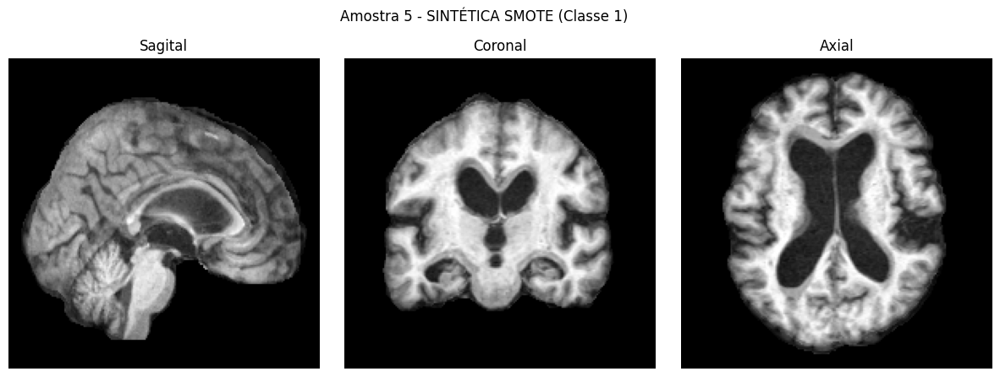

--------------------------------------------------


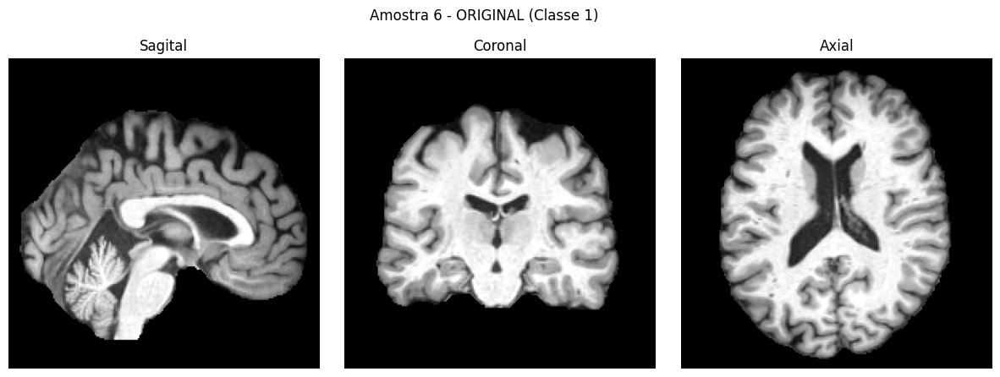

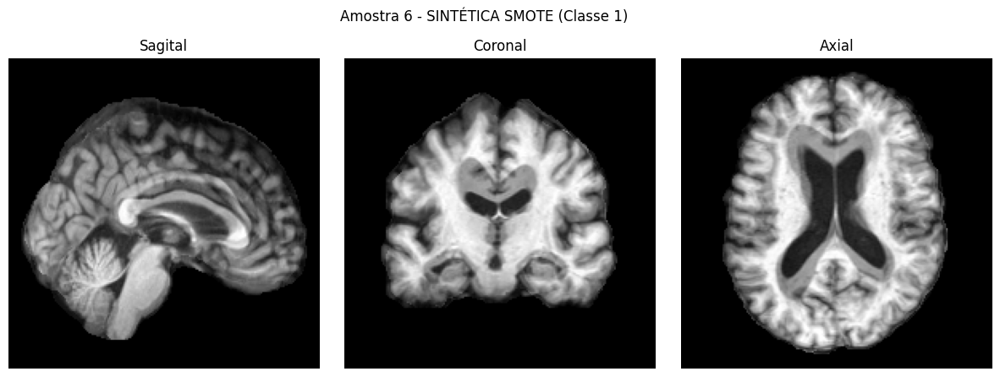

--------------------------------------------------
Processo de plotagem de pares (Original vs Sintético) concluído.

--- INICIANDO TESTE SMOTE (Amostra de 60 imagens) ---
Shape original dos dados: (60, 156, 195, 160, 1)
Aplicando SMOTE...
Gerados 27 novos exemplos sintéticos.
Iniciando plotagem de 25 pares (Original vs Sintético)...


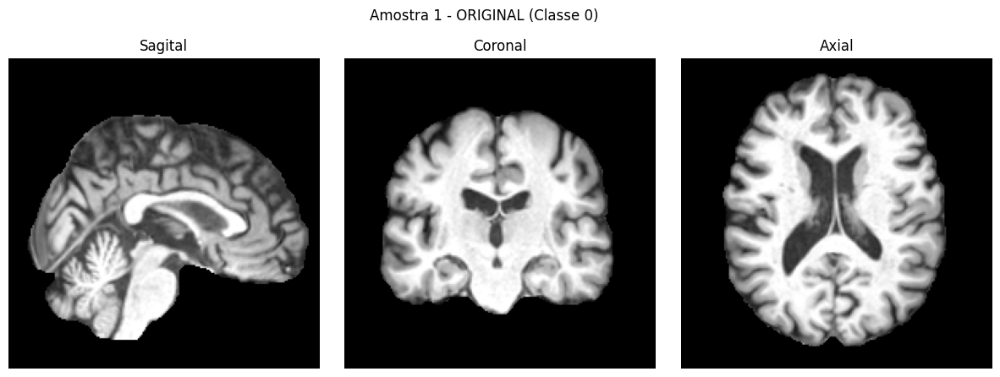

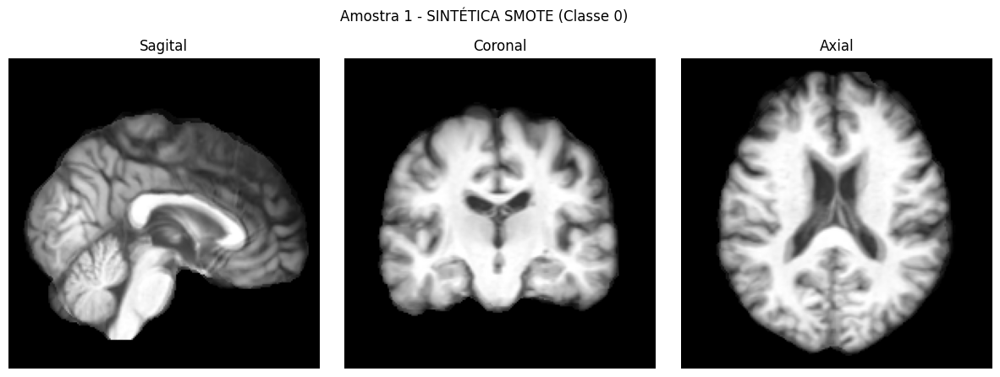

--------------------------------------------------


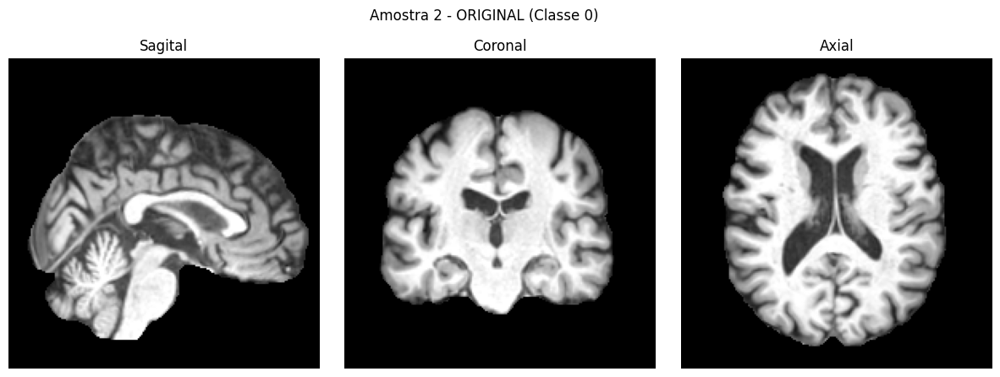

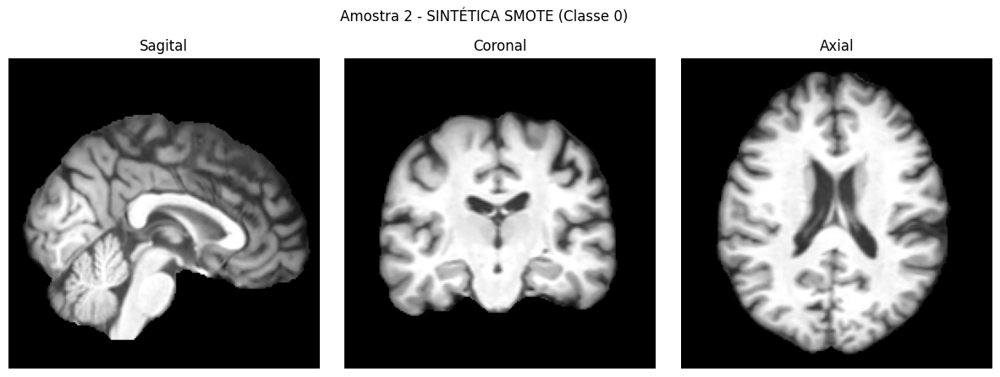

--------------------------------------------------


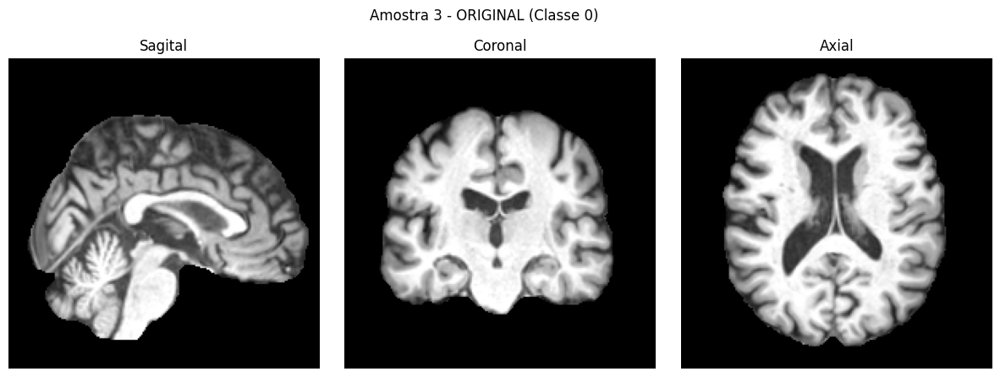

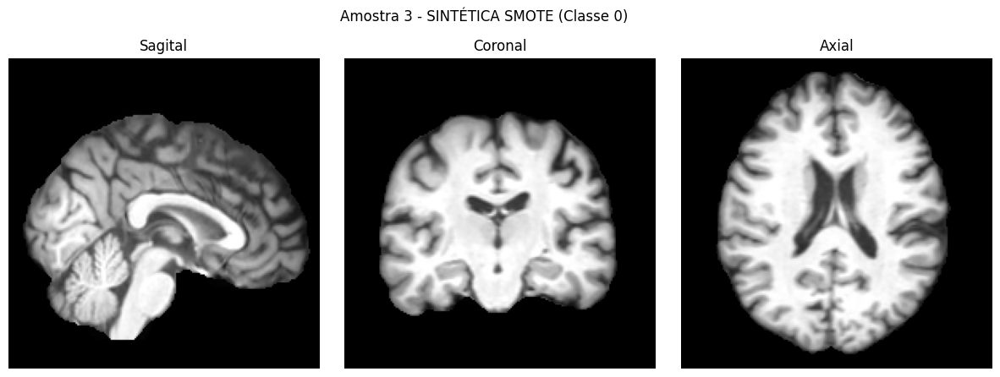

--------------------------------------------------


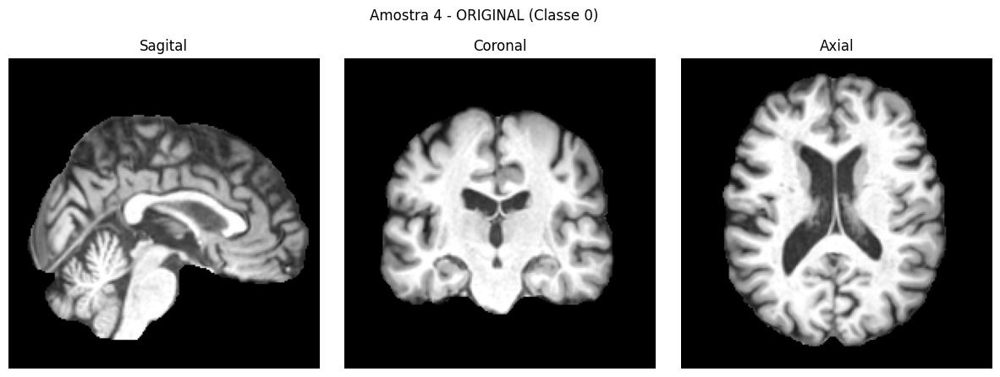

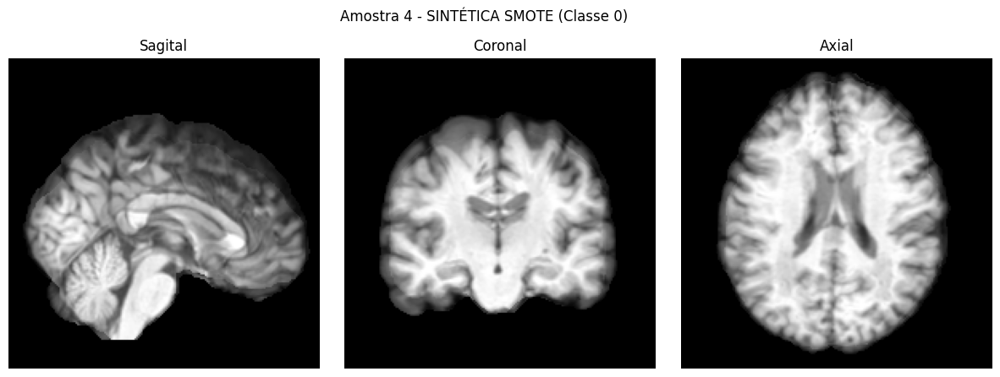

--------------------------------------------------


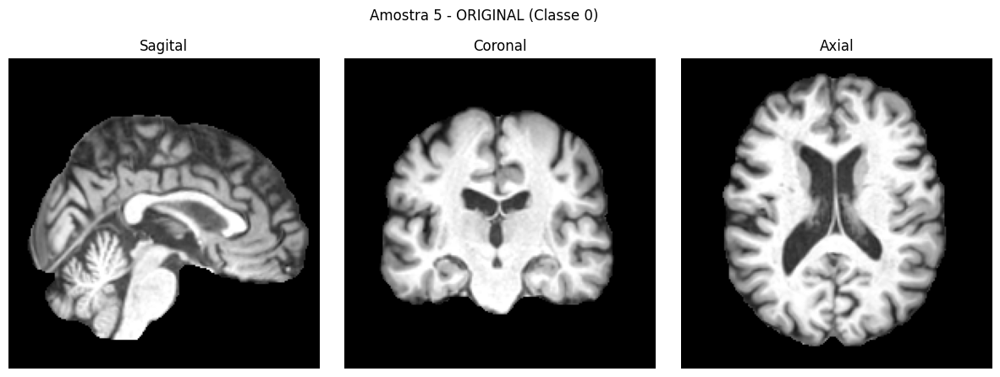

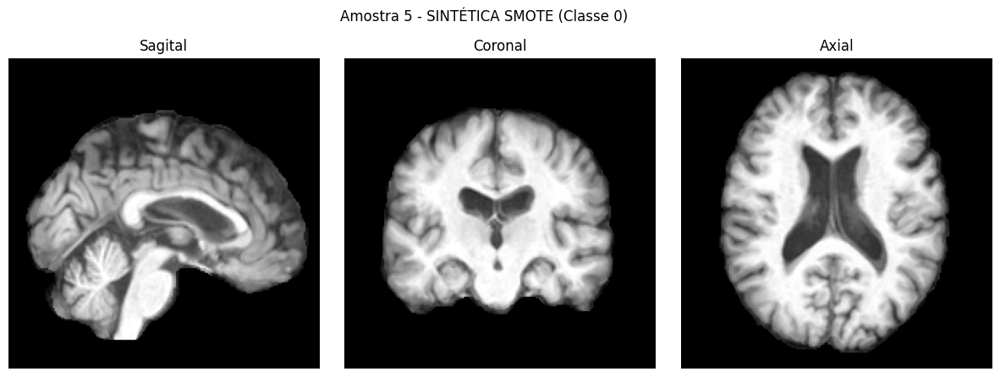

--------------------------------------------------


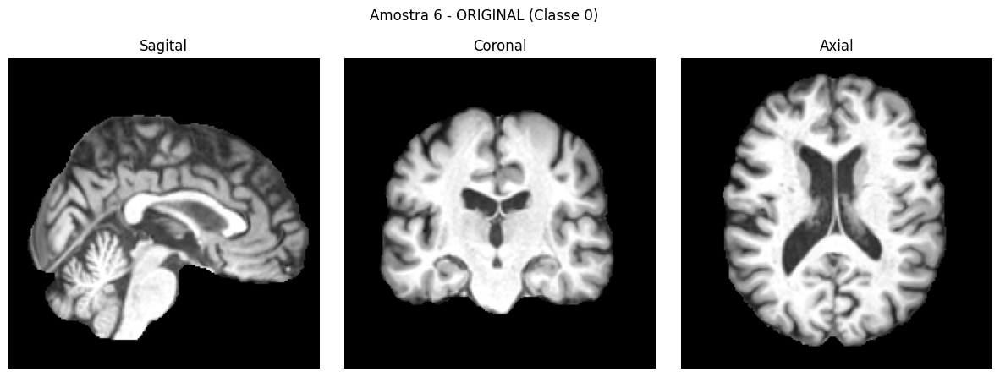

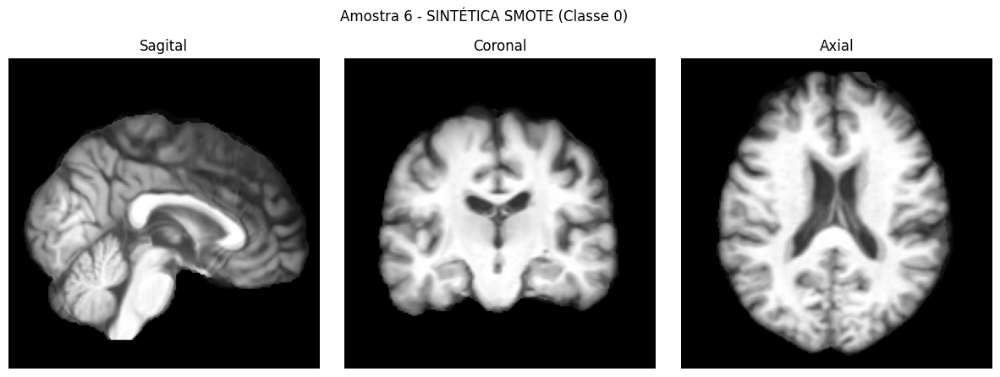

--------------------------------------------------


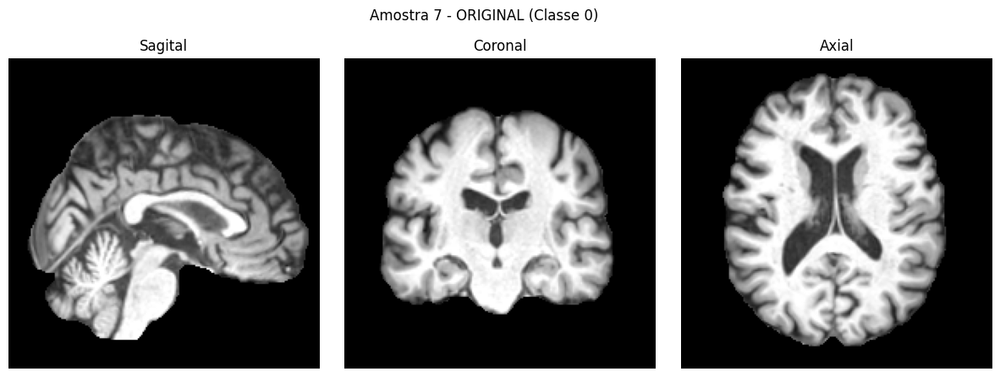

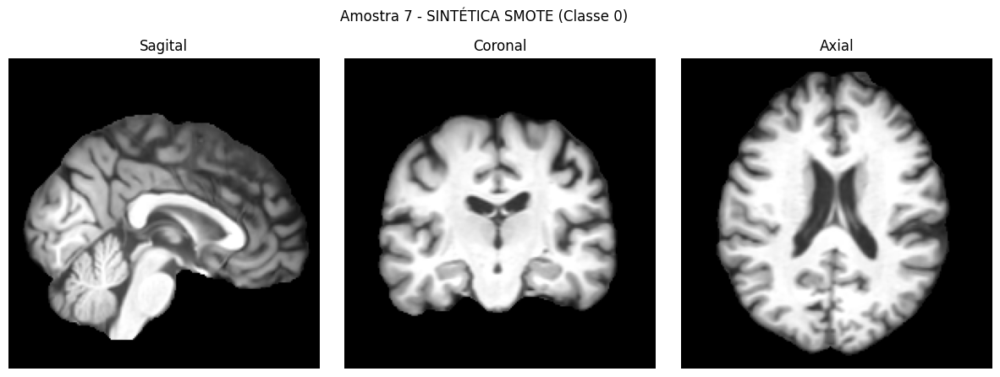

--------------------------------------------------


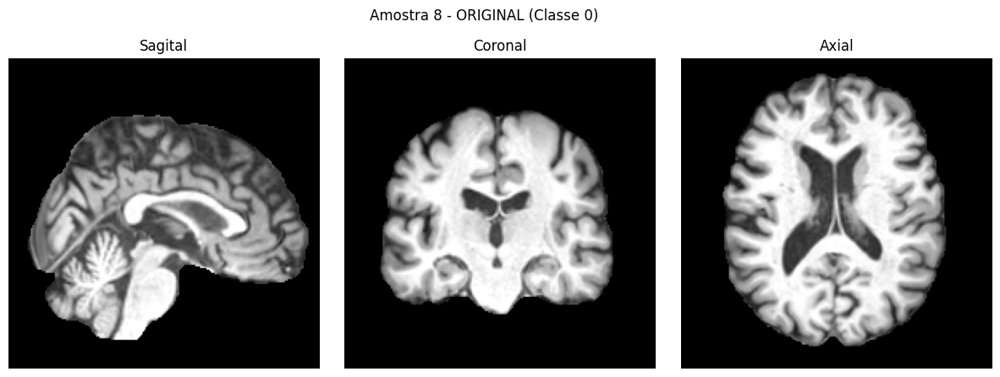

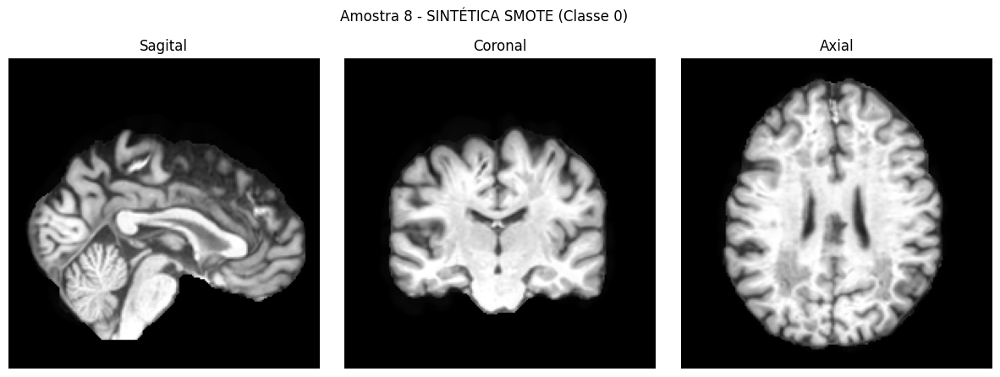

--------------------------------------------------


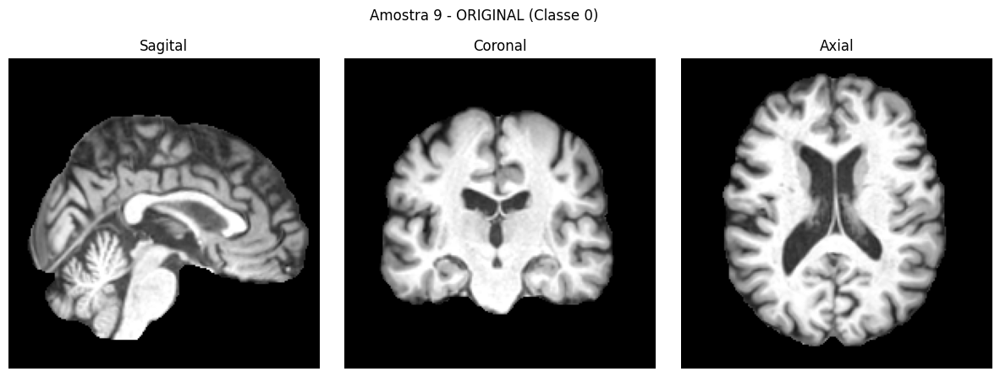

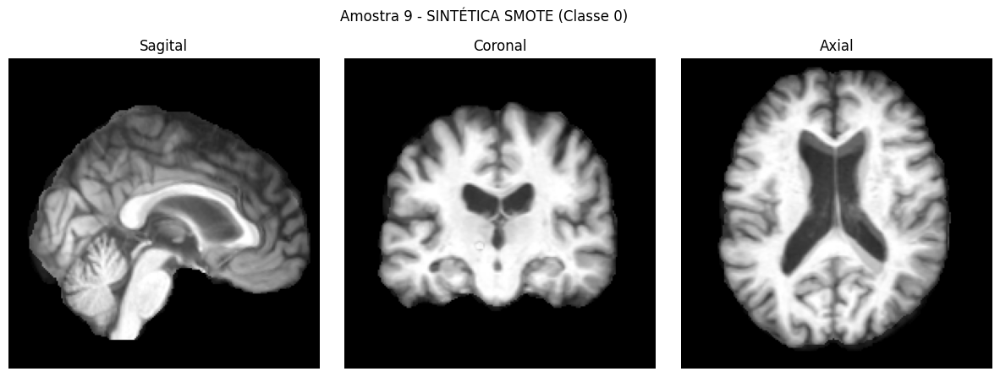

--------------------------------------------------


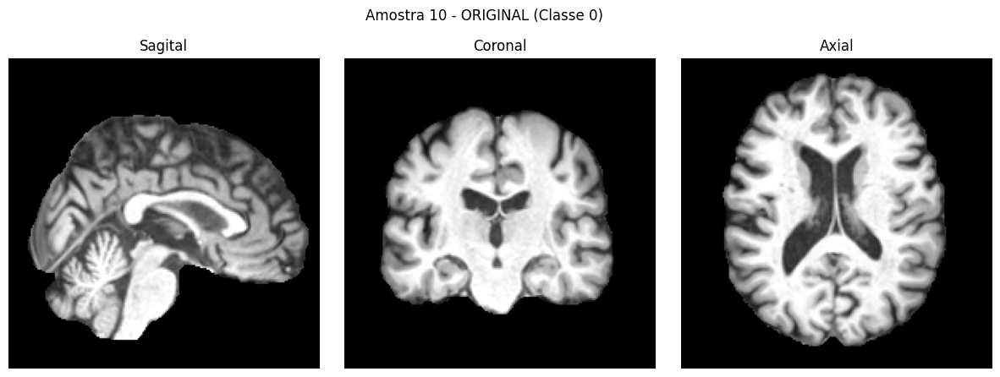

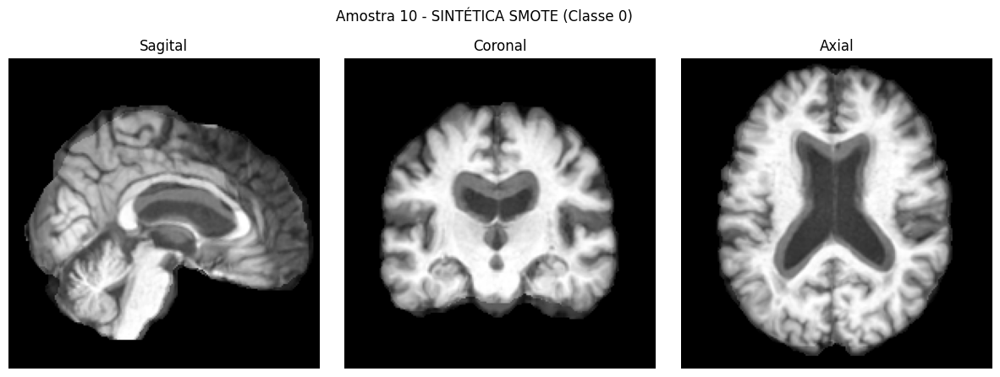

--------------------------------------------------


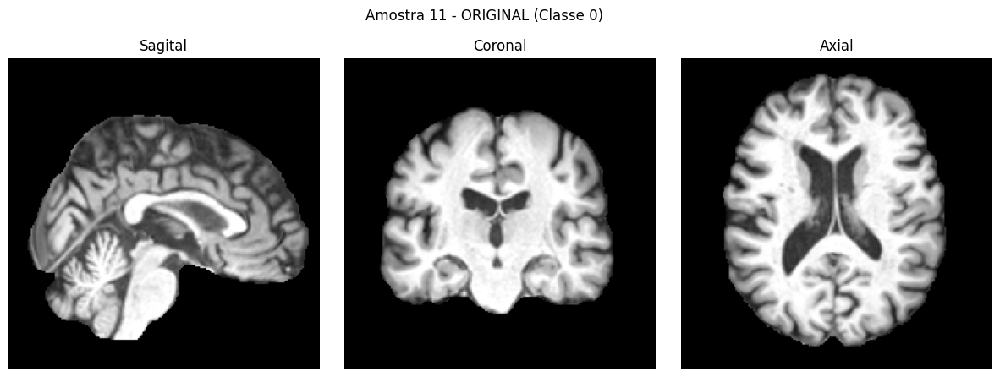

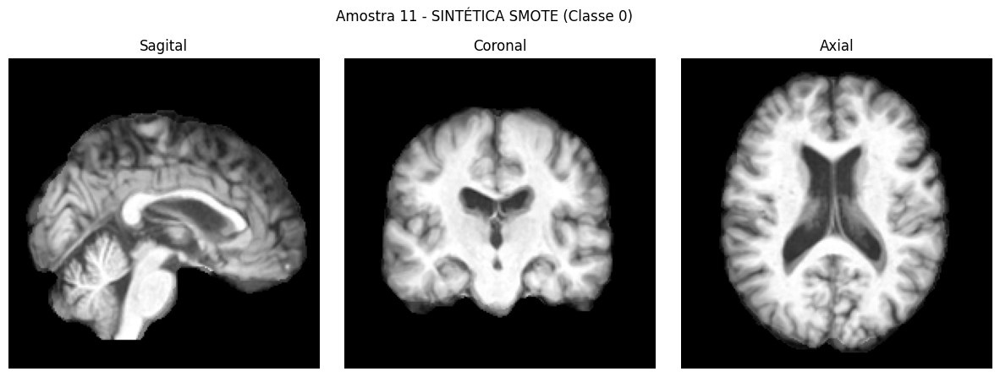

--------------------------------------------------


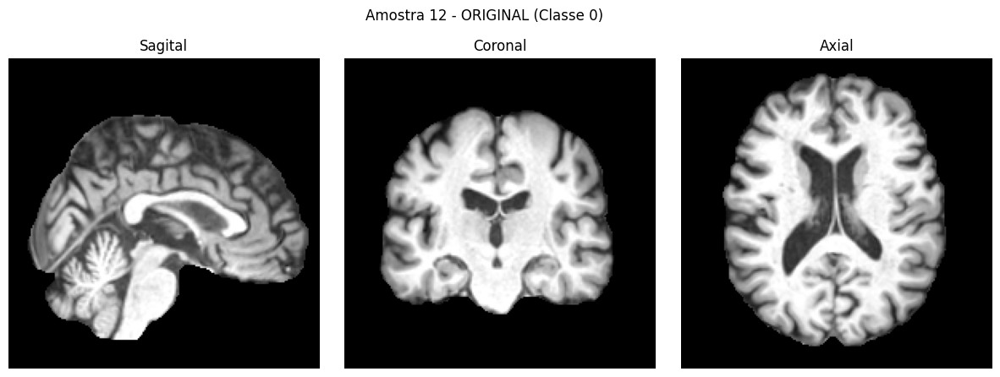

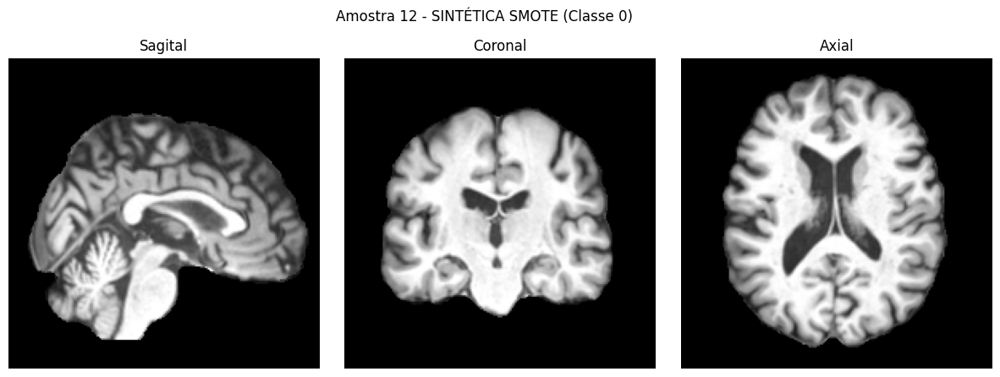

--------------------------------------------------


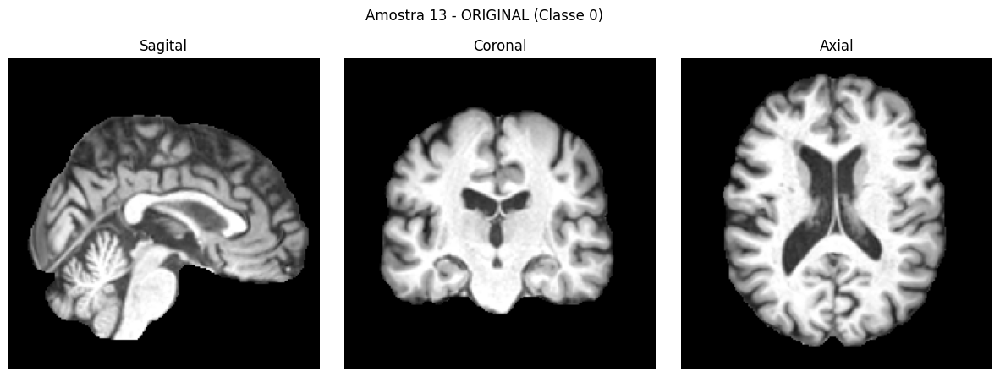

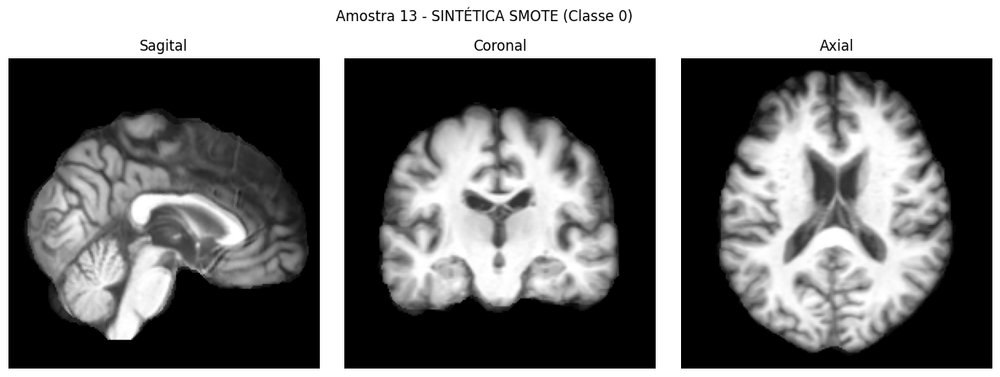

--------------------------------------------------


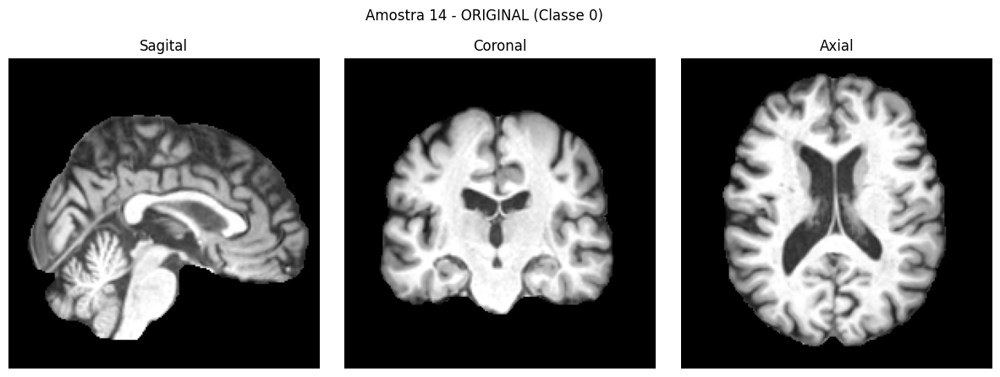

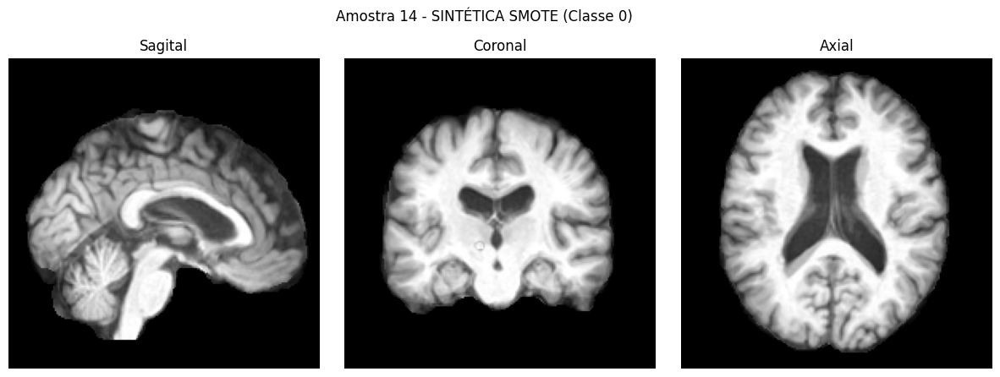

--------------------------------------------------


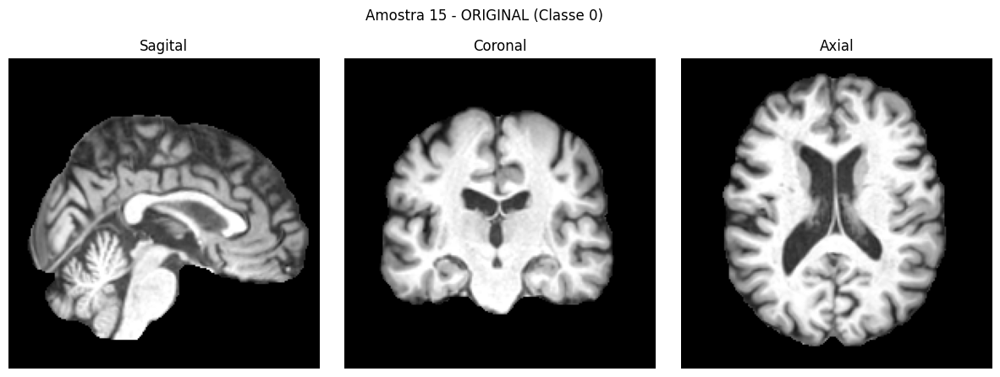

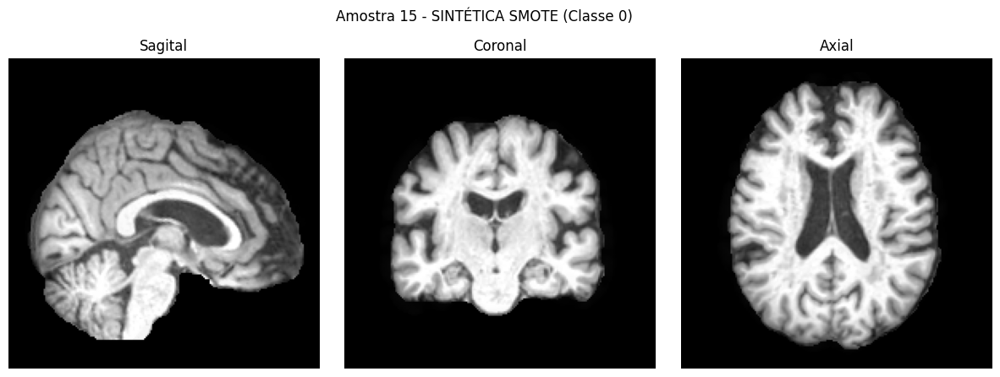

--------------------------------------------------


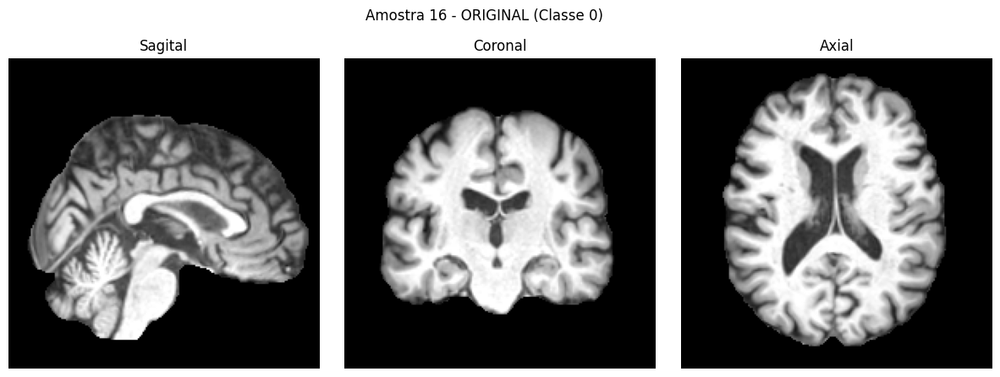

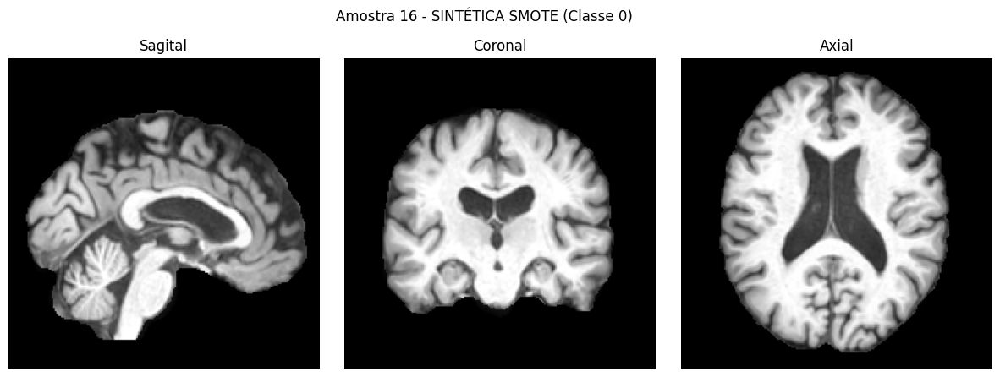

--------------------------------------------------


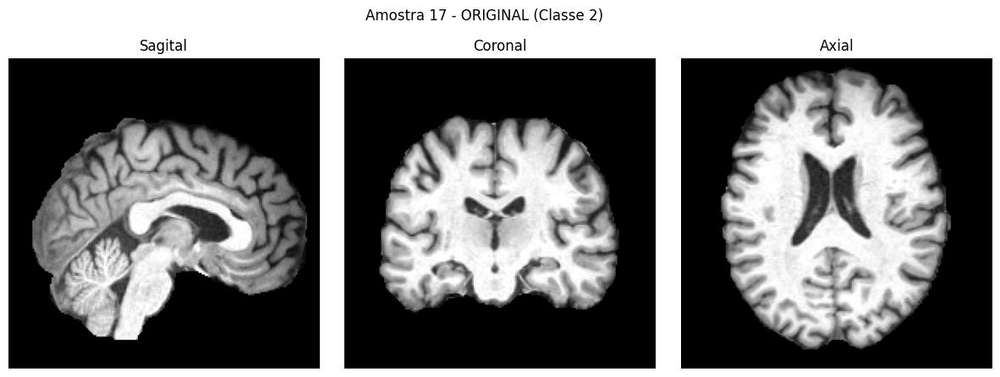

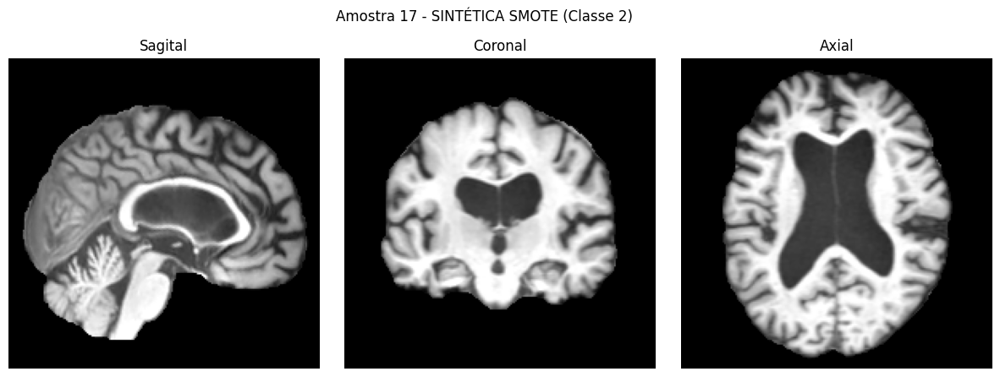

--------------------------------------------------


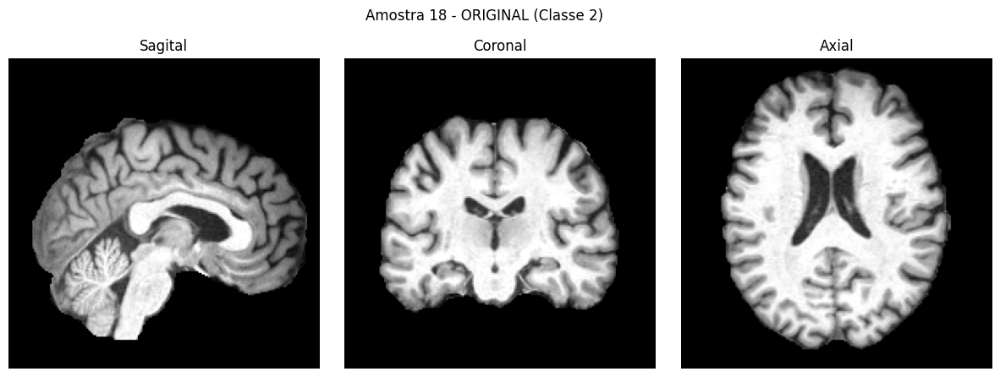

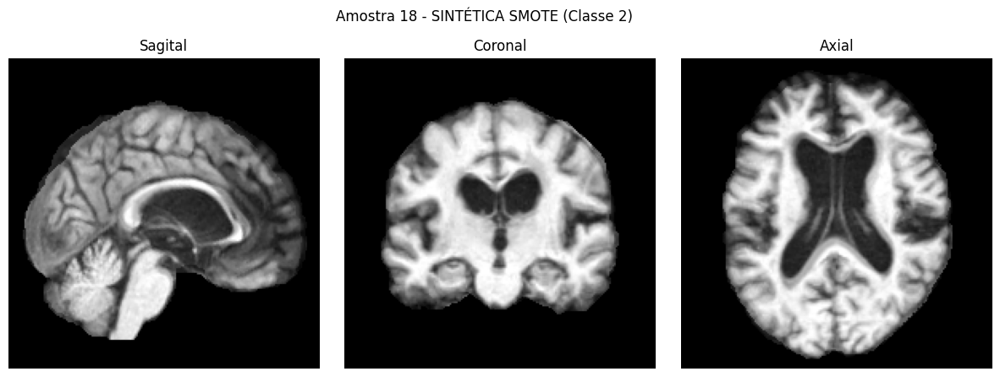

--------------------------------------------------


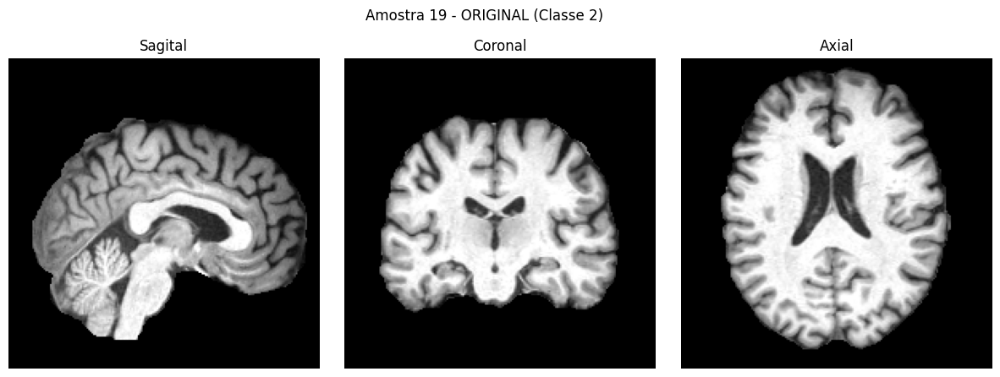

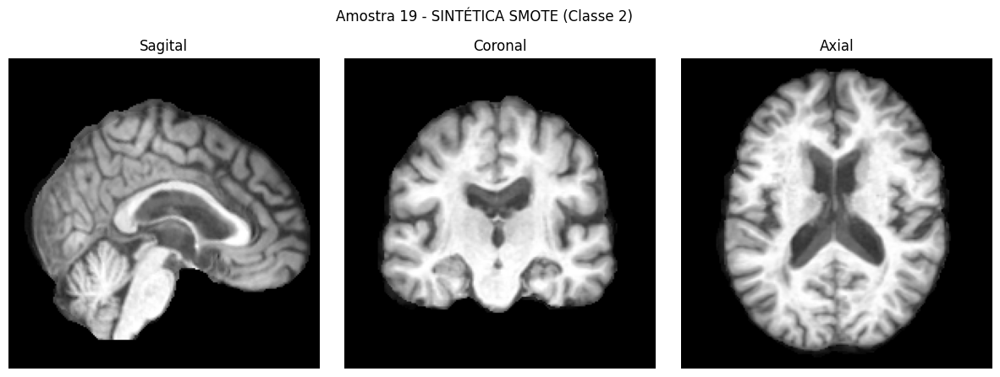

--------------------------------------------------


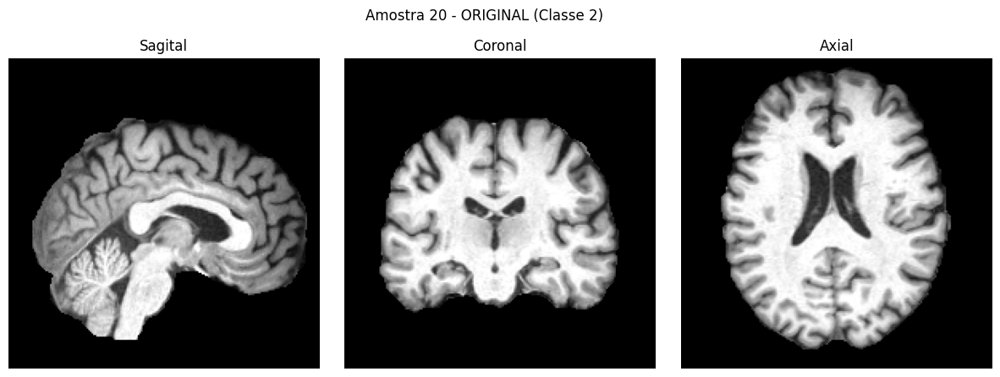

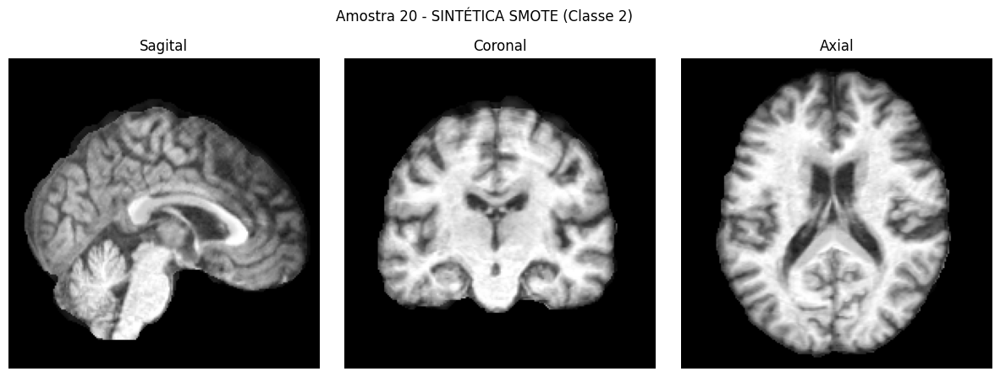

--------------------------------------------------


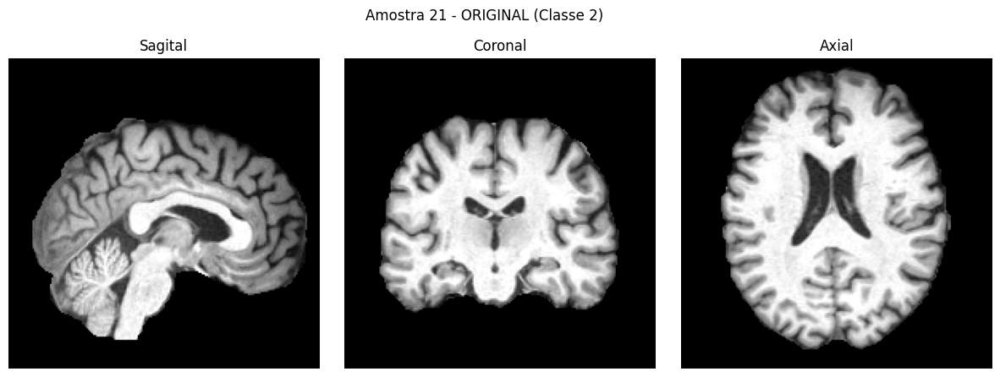

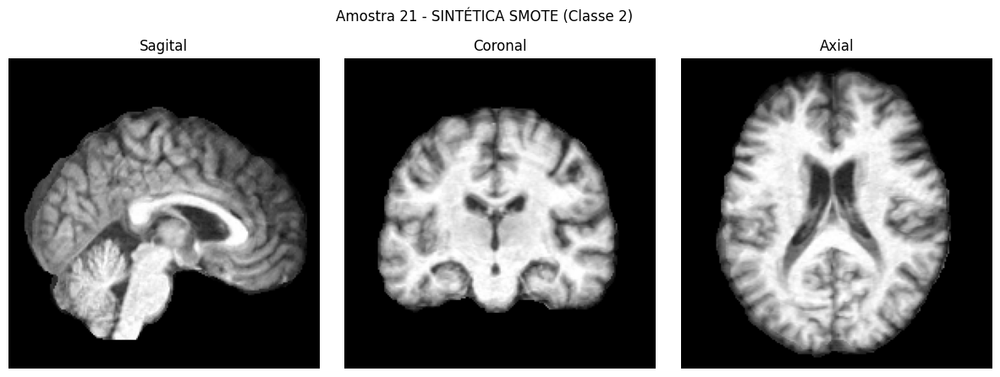

--------------------------------------------------


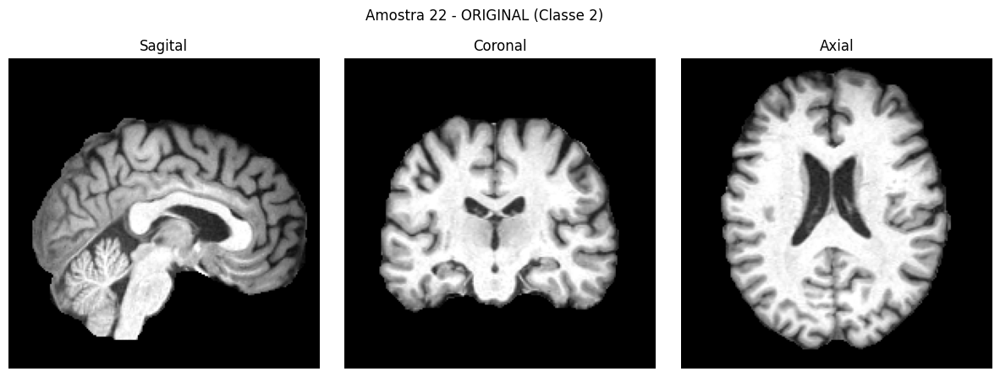

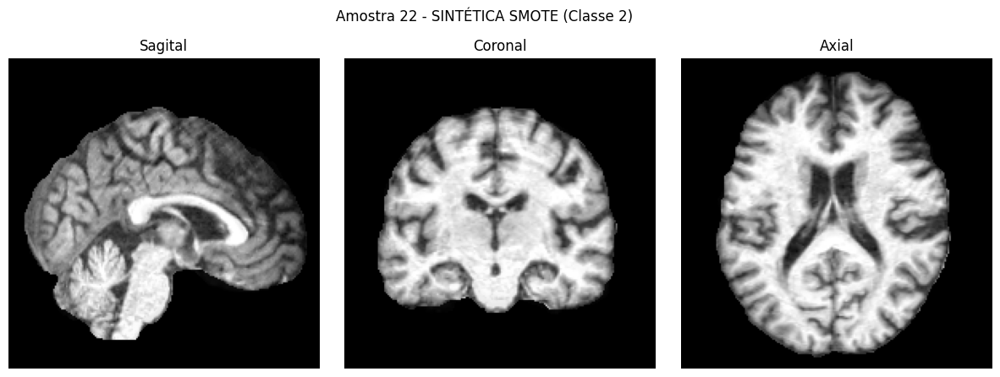

--------------------------------------------------


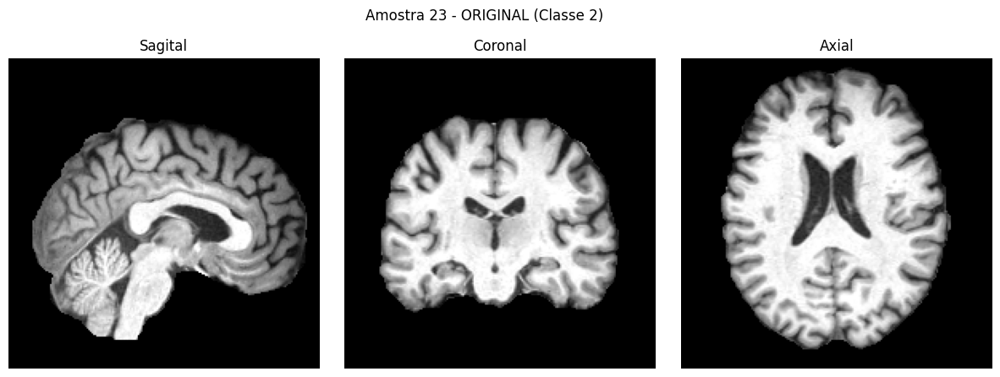

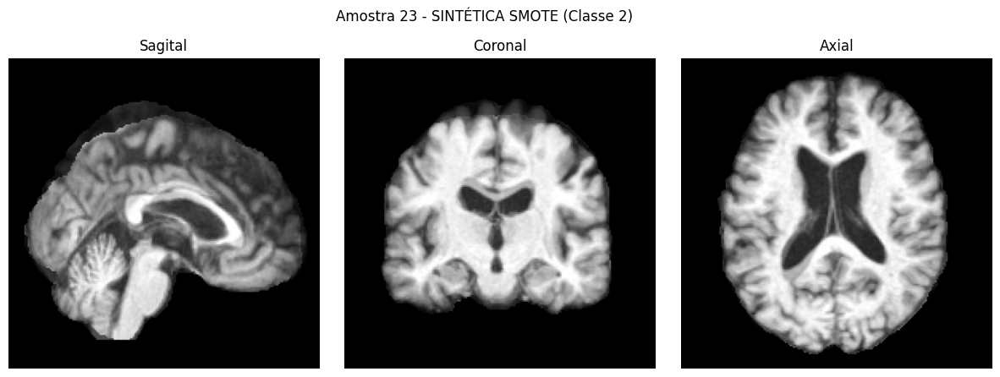

--------------------------------------------------


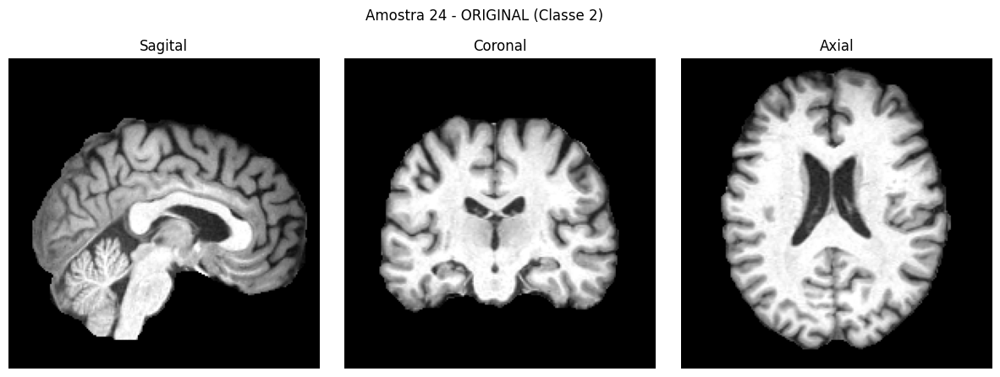

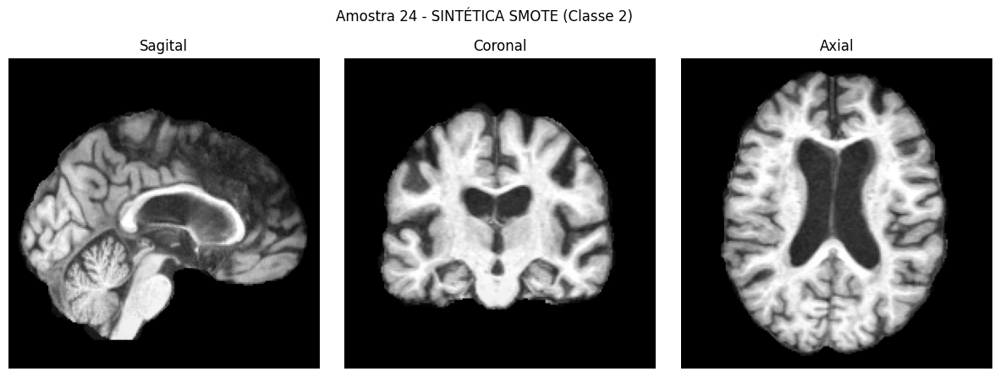

--------------------------------------------------


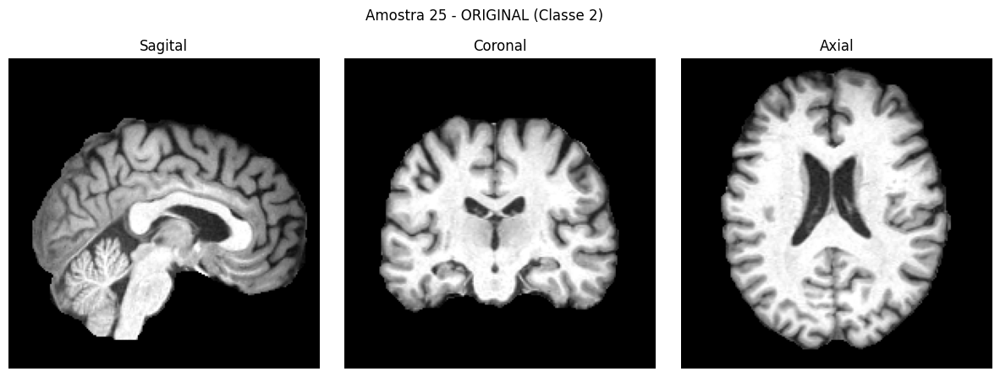

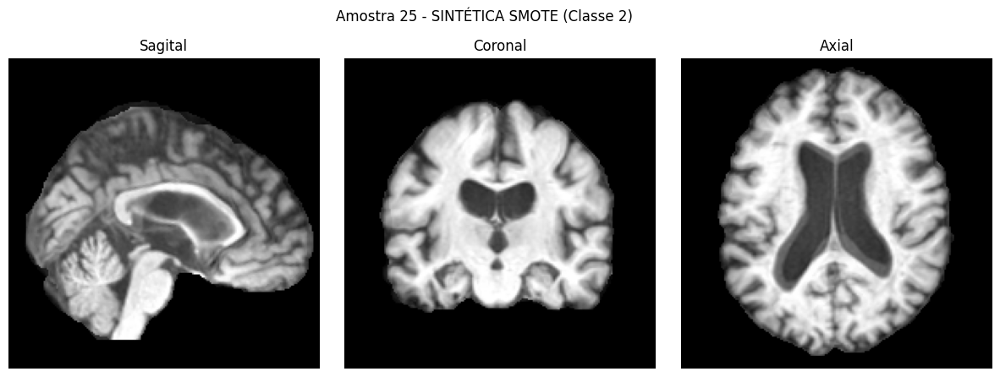

--------------------------------------------------
Processo de plotagem de pares (Original vs Sintético) concluído.


In [12]:
import numpy as np
import nibabel as nib
from imblearn.over_sampling import SMOTE
import matplotlib.pyplot as plt
from mpl_toolkits.axes_grid1 import ImageGrid # Necessário para plot_views_uniforme_final

# As funções unificar_tamanhos_com_padding e plot_views_uniforme_final devem estar definidas
# antes de chamar test_smote_generation.

def unificar_tamanhos_com_padding(lista_de_imagens):
    max_altura = 0
    max_largura = 0
    for img in lista_de_imagens:
        altura, largura = img.shape
        if altura > max_altura:
            max_altura = altura
        if largura > max_largura:
            max_largura = largura

    imagens_uniformes = []
    for img in lista_de_imagens:
        fundo = np.zeros((max_altura, max_largura))
        
        altura_img, largura_img = img.shape
        y_offset = (max_altura - altura_img) // 2
        x_offset = (max_largura - largura_img) // 2
        
        fundo[y_offset:y_offset+altura_img, x_offset:x_offset+largura_img] = img
        imagens_uniformes.append(fundo)
        
    return imagens_uniformes

def plot_views_uniforme_final(image, main_title, k=0, sag_idx=90, cor_idx=110, ax_idx=110, figsize=(15, 5), axes_pad=0.3):
    fig = plt.figure(figsize=figsize)
    grid = ImageGrid(fig, 111,
                     nrows_ncols=(1, 3),
                     axes_pad=axes_pad)
    
    # Adaptação para imagens 3D/4D: Se a imagem tiver 4 dimensões e a última for 1 (canal), remove.
    if image.ndim == 4 and image.shape[-1] == 1:
        image = image.squeeze(axis=-1)
        
    slices_originais = [
        np.rot90(image[sag_idx, :, :], k=k),
        np.rot90(image[:, cor_idx, :], k=k),
        np.rot90(image[:, :, ax_idx], k=k)
    ]
    
    slices_uniformizadas = unificar_tamanhos_com_padding(slices_originais)
    
    titles = ["Sagital", "Coronal", "Axial"]

    for ax, im_slice, title in zip(grid, slices_uniformizadas, titles):
        ax.imshow(im_slice, cmap='gray')
        ax.set_title(title)
        ax.axis('off')

    fig.suptitle(main_title)
    plt.show()

def test_smote_generation(data_input, labels, num_samples=30):
    print(f"\n--- INICIANDO TESTE SMOTE (Amostra de {num_samples} imagens) ---")
    
    # 1. Carregar e preparar subset (Lógica mantida)
    subset_images = []
    subset_labels = []
    
    total_samples = len(data_input)
    # Garante que temos pelo menos 10 amostras originais, se possível, para o teste visual
    real_num_samples = min(total_samples, num_samples)
    indices = np.random.choice(total_samples, real_num_samples, replace=False)
    
    for idx in indices:
        item = data_input[idx]
        label = labels[idx]
        
        # Verifica se é path ou array
        if isinstance(item, (str, np.str_)):
            img = nib.load(str(item)).get_fdata()
        else:
            img = item
            
        # Garante numpy array
        if not isinstance(img, np.ndarray):
            if hasattr(img, 'numpy'):
                img = img.numpy()
            else:
                img = np.array(img)

        # Normalização (0-1)
        img_min, img_max = np.min(img), np.max(img)
        if img_max - img_min > 0:
            img = (img - img_min) / (img_max - img_min)
        
        subset_images.append(img)
        
        # Tratamento do Label
        if isinstance(label, (np.ndarray, list)):
            if len(np.array(label).shape) > 0 and np.array(label).shape[0] > 1: 
                subset_labels.append(np.argmax(label))
            else:
                val = label[0] if len(label) > 0 else label
                subset_labels.append(val)
        else:
            subset_labels.append(label)

    X = np.array(subset_images)
    y = np.array(subset_labels)
    
    print(f"Shape original dos dados: {X.shape}")
    
    # 2. Flattening Dinâmico
    n_samples = X.shape[0]
    original_img_shape = X.shape[1:] 
    
    X_flattened = X.reshape(n_samples, -1)
    
    # 3. Aplicar SMOTE
    print("Aplicando SMOTE...")
    
    k = 3
    if real_num_samples < 10:
        k = 1
    
    try:
        smote = SMOTE(k_neighbors=k) 
        X_resampled_flat, y_resampled = smote.fit_resample(X_flattened, y)
    except ValueError as e:
        print(f"Erro no SMOTE: {e}")
        print("Dica: O subset sorteado provavelmente tem classes com menos de k_neighbors + 1 exemplos.")
        return

    # 4. Reconstrução
    num_new_samples = len(X_resampled_flat) - len(X_flattened)
    if num_new_samples == 0:
        print("Classes já balanceadas, nada gerado.")
        return
        
    print(f"Gerados {num_new_samples} novos exemplos sintéticos.")

    X_resampled_Nd = X_resampled_flat.reshape((len(X_resampled_flat), *original_img_shape))
    
    # 5. Lógica de Plotagem (Plotar 5 Originais e 5 Sintéticos)
    
    NUM_PLOTS = 25 # Queremos 5 pares (Original + Sintético)
    
    # Encontra os novos índices (os últimos N novos exemplos)
    synthetic_indices = np.arange(len(X_flattened), len(X_resampled_flat))
    
    if len(synthetic_indices) < NUM_PLOTS:
        print(f"Apenas {len(synthetic_indices)} amostras sintéticas geradas. Plotando todas.")
        NUM_PLOTS = len(synthetic_indices)
        
    indices_to_plot = synthetic_indices[:NUM_PLOTS]
    
    print(f"Iniciando plotagem de {NUM_PLOTS} pares (Original vs Sintético)...")
    
    for i, synth_idx in enumerate(indices_to_plot):
        synthetic_img = X_resampled_Nd[synth_idx]
        synthetic_label = y_resampled[synth_idx]
        
        # Encontra o índice da primeira imagem original da mesma classe
        # (Para ter uma base de comparação visual)
        orig_indices = np.where(y == synthetic_label)[0]
        
        if len(orig_indices) > 0:
            original_img = X[orig_indices[0]] 
        else:
            print(f"Aviso: Não há amostra original no subset sorteado para a classe {synthetic_label}")
            continue

        # --- Plotagem da Imagem Original ---
        # Se for 4D, remove o canal para plot_views_uniforme_final
        if original_img.ndim == 4 and original_img.shape[-1] == 1:
            original_img = original_img.squeeze(axis=-1)
        
        plot_views_uniforme_final(
            original_img, 
            main_title=f"Amostra {i+1} - ORIGINAL (Classe {synthetic_label})",
            sag_idx=original_img_shape[0] // 2, 
            cor_idx=original_img_shape[1] // 2,
            ax_idx=original_img_shape[2] // 2, 
            k = 1
        )
        
        # --- Plotagem da Imagem Sintética ---
        # Se for 4D, remove o canal para plot_views_uniforme_final
        if synthetic_img.ndim == 4 and synthetic_img.shape[-1] == 1:
            synthetic_img = synthetic_img.squeeze(axis=-1)

        plot_views_uniforme_final(
            synthetic_img, 
            main_title=f"Amostra {i+1} - SINTÉTICA SMOTE (Classe {synthetic_label})",
            sag_idx=original_img_shape[0] // 2,
            cor_idx=original_img_shape[1] // 2,
            ax_idx=original_img_shape[2] // 2,
            k = 1
        )
        
        print("-" * 50)
        
    print("Processo de plotagem de pares (Original vs Sintético) concluído.")

test_smote_generation(train_images, train_labels, num_samples=30)
test_smote_generation(val_images, val_labels, num_samples=60)